# Making Sense of Pixels: Everything About Computer Vision You Should Know
## Resource (majority):
1. Class materials of DLCV by Rih-Teng Wu
2. Opencv Documentation (https://docs.opencv.org/4.x/index.html)
3. Bradski, G., & Kaehler, A. (2008). Learning OpenCV: Computer vision with the OpenCV library. O'Reilly Media.

# Table of Contents

## Section 1: Image Fundamentals and Basic Operations
- [1.1 Image Basics and I/O](#11-image-basics-and-io)
- [1.2 Basic Image Manipulations](#1.2-Basic-Image-Manipulations)
- [1.3 Color Spaces and Conversions](#1.3-Color-Spaces-and-Conversions)
- [1.4 Drawing and Annotation Functions](#1.4-Drawing-and-Annotation-Functions)

## Section 2: Image Enhancement and Filtering
- [2.1 Smoothing and Noise Reduction](#2.1-Smoothing-and-Noise-Reduction)
- [2.2 Morphological Operations](#2.2-Morphological-Operations)
- [2.3 Image Sharpening and Enhancement](#2.3-Image-Sharpening-and-Enhancement)
- [2.4 Advanced Filtering](#2.4-Advanced-Filtering)

## Section 3: Feature Detection and Extraction
- [3.1 Edge Detection](#3.1-Edge-Algorithms)
- [3.2 Corner Detection](#3.2-Corner-Detection)
- [3.3 Feature Matching](#3.3-Feature-Matching)
- [3.4 Template Matching](#3.4-Template-Matching)

## Section 4: Image Segmentation
- [4.1 Thresholding Methods](#4.1-Thresholding-Methods)
- [4.2 Superpixel Segmentation](#4.2-Superpixel-Segmentation)
- [4.3 Advanced Segmentation Method](#4.3-Advanced-Segmentation-Method)
- [4.4 Find Contour](#4.4-Find-Contour)

## Section 5: Geometric Transformations and Registration
- [5.1 Basic Transformations](#5.1-Basic-Transformations)
- [5.2 Image Wrapping and Perspective Transformation](#5.2-Image-Wrapping-and-Perspective-Transformation)
- [5.3 Homography Estimation and Image Stitching](#5.3-Homography-Estimation-and-Image-Stitching)
- [5.4 Application - Panorama](#5.3-Application---Panorama)


## Section 6: Camera Geometry and 3D Vision
- [6.1 Camera Calibration](#6.1-Camera-Calibration)
- [6.2 Application - toy example](#6.2-Application---toy-example)

## Section 7: Advanced Applications of CV
- [7.1 Lane Detection (Hough Transform)](#7.1-Lane-Detection-(Hough-Transform))
- [7.2 Image inpainting and restoration (Gaussian pyramid)](#7.2-Image-inpainting-and-restoration-(Gaussian-pyramid))
- [7.3 Document and Text Processing (OCR, OMR)](#7.3-Document-and-Text-Processing-(OCR,-OMR))
- [7.4 3D Reconstruction](#7.4-3D-Reconstruction)


### Load Necessary Package

In [1]:
%matplotlib inline
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import math
import cv2

### Plot Function

In [2]:
def plot_images(images, *labels, plot_name="Image Grid", single = False, rect = False):
    assert len(images) == len(labels)

    num_images = len(images)
    cols = math.ceil(math.sqrt(num_images))
    rows = math.ceil(num_images / cols)
    if single:
        if rect:
            fig, axes = plt.subplots(rows, cols, figsize=(cols * 7, rows * 3))
            fig.suptitle(plot_name, fontsize=16)
        else:
            fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
            fig.suptitle(plot_name, fontsize=16)
    else:
        fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
        fig.suptitle(plot_name, fontsize=16)

    if rows == 1 and cols == 1:
        axes = [[axes]]
    elif rows == 1 or cols == 1:
        axes = [axes] if rows == 1 else [[ax] for ax in axes]
    else:
        axes = axes.reshape((rows, cols))

    for i in range(rows * cols):
        r, c = divmod(i, cols)
        ax = axes[r][c]

        if i < num_images:
            img_rgb = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
            ax.imshow(img_rgb)
            ax.set_title(labels[i])
        ax.axis('off')

    plt.tight_layout()
    return plt

### Define Data Folder Directory 

In [3]:
img_data_path = 'data'

# Section 1: Image Fundamentals and Basic Operations

## 1.1 Image Basics and I/O

### Loading, Displaying, and Saving Images

In [4]:
# Load image - OpenCV loads in BGR format by default
img_basics = cv2.imread(os.path.join(img_data_path,'general.jpg'))

# Displaying, 
cv2.imshow('Original Image', img_basics)
# how long to wait for a key press for the window to close, zero means indefinitely
cv2.waitKey(0)
cv2.destroyAllWindows()
# saving image
cv2.imwrite(os.path.join(img_data_path,'general_save.jpg'), img_basics)

True

### Pixels, Channels, Image Properties
![alternatvie text](https://lh3.googleusercontent.com/d/1I3ePw5Tev18Up1Ac0b-4K1fCL89oTqyB)
![alternatvie text](https://lh3.googleusercontent.com/d/1URH5bDLAmgOcbUkgJrqbzmk7wa8Cmpji)

In [5]:
def img_basics_info(img):
    # pixels value, properties
    print(f"Shape: {img.shape}")
    img_height, img_width, img_channels = img.shape
    print(f"Height: {img_height}")
    print(f"Width: {img_width}")
    print(f"Channels: {img_channels}")
    print(f"Pixel value at top-left: {img[0,0]}")
    print(f"Total pixels: {img.size}")
    print(f"Data type: {img.dtype}")
img_basics_info(img_basics)


Shape: (1350, 1080, 3)
Height: 1350
Width: 1080
Channels: 3
Pixel value at top-left: [192 237 250]
Total pixels: 4374000
Data type: uint8


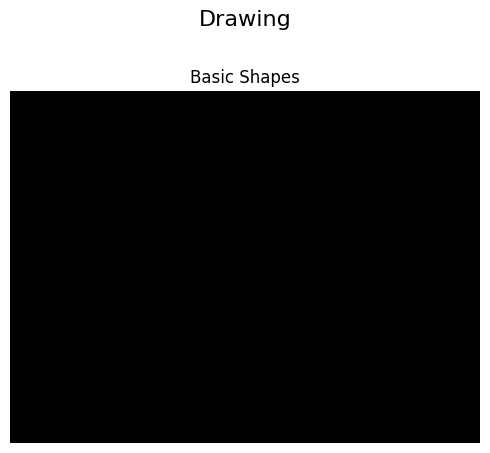

In [6]:
# Create an empty image
img_empty= np.zeros((300, 400, 3), dtype=np.uint8)
plot = plot_images([img_empty], 'Basic Shapes', plot_name="Drawing", single=True)
plot.show()

## 1.２ Basic Image Manipulations

### Resizing with different interpolation methods 內插法

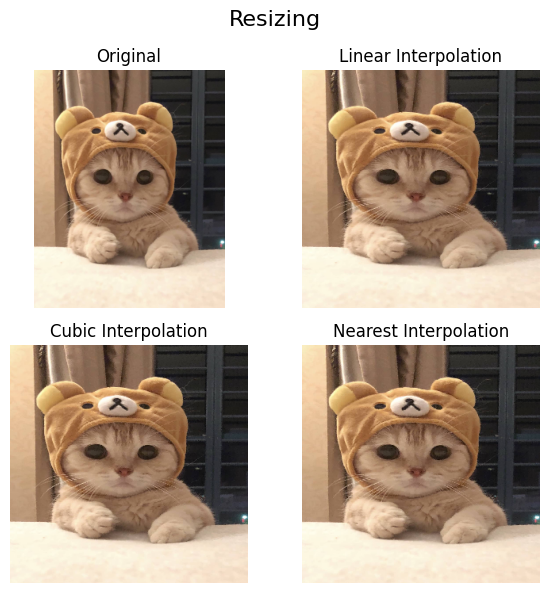

In [7]:
resized_linear = cv2.resize(img_basics, (300, 300), interpolation=cv2.INTER_LINEAR)
resized_cubic = cv2.resize(img_basics, (300, 300), interpolation=cv2.INTER_CUBIC)
resized_nearest = cv2.resize(img_basics, (300, 300), interpolation=cv2.INTER_NEAREST)
plot = plot_images([img_basics, resized_linear,resized_cubic,resized_nearest], "Original", "Linear Interpolation","Cubic Interpolation","Nearest Interpolation", plot_name="Resizing")
plot.show()

### Cropping and region of interest (ROI) operations 裁減

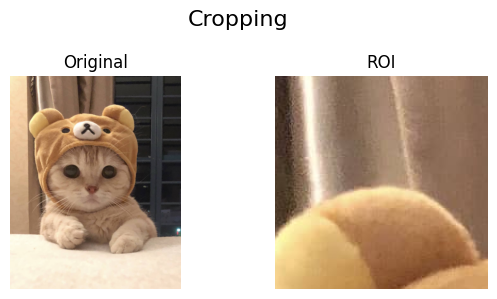

In [8]:
# ROI selection 裁減
roi_cropping = img_basics[100:300, 150:350]
plot = plot_images([img_basics, roi_cropping], "Original", "ROI", plot_name="Cropping")
plot.show()

### Image arithmetic (addition, subtraction, blending, masking)

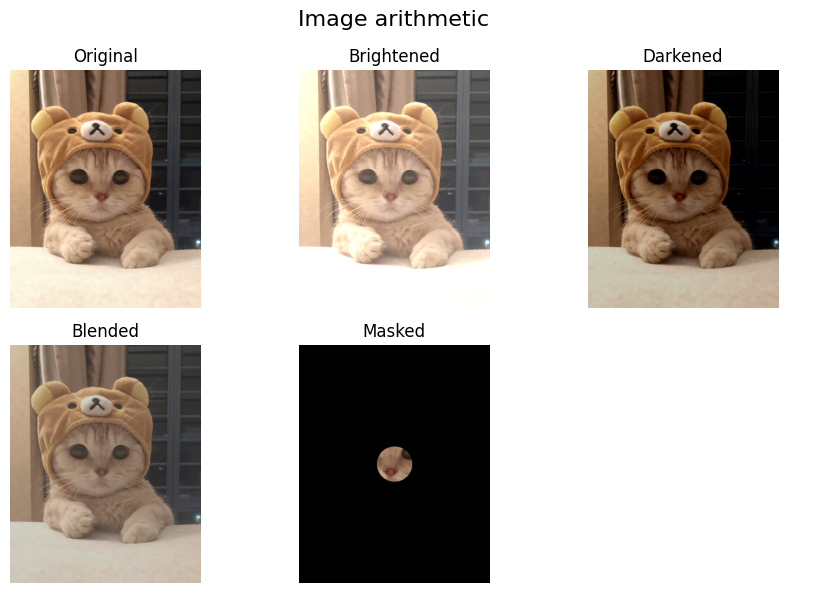

In [9]:
# Addition
bright = cv2.add(img_basics, np.ones(img_basics.shape, dtype=np.uint8) * 50)

# Subtraction  
dark = cv2.subtract(img_basics, np.ones(img_basics.shape, dtype=np.uint8) * 50)

# Blending 混和 將剛變亮的和變暗的相加
overlay = np.ones(img_basics.shape, dtype=np.uint8) * 100
blended = cv2.addWeighted(img_basics, 0.7, overlay, 0.3, 0)

# Masking 全黑 中間替換成原本的
mask = np.zeros(img_basics.shape[:2], dtype=np.uint8)
cv2.circle(mask, (img_basics.shape[1]//2, img_basics.shape[0]//2), 100, 255, -1)
masked = cv2.bitwise_and(img_basics, img_basics, mask=mask)

plot = plot_images([img_basics, bright, dark, blended, masked], "Original", "Brightened", 'Darkened', 'Blended', 'Masked', plot_name="Image arithmetic")
plot.show()

### Flipping, rotating, and basic transformations

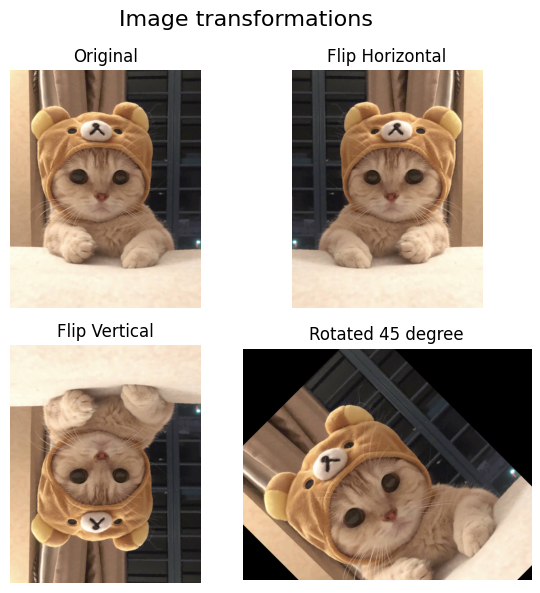

In [10]:
# Flipping
flip_horizontal = cv2.flip(img_basics, 1)
flip_vertical = cv2.flip(img_basics, 0)
flip_both = cv2.flip(img_basics, -1)

# Rotation
img_basics_width, img_basics_height, img_channels = img_basics.shape
center = (img_basics_width//2, img_basics_height//2)
rotation_matrix = cv2.getRotationMatrix2D(center, 45, 1.0)
rotated = cv2.warpAffine(img_basics, rotation_matrix, (img_basics_width, img_basics_height))
plot = plot_images([img_basics, flip_horizontal, flip_vertical, rotated],"Original", "Flip Horizontal", "Flip Vertical", 'Rotated 45 degree', plot_name="Image transformations")
plot.show()


## 1.3 Color Spaces and Conversions

### RGB, BGR, HSV, LAB, YUV color spaces

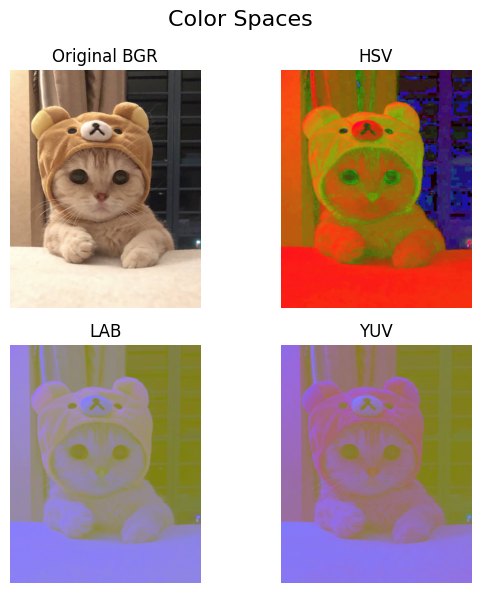

In [11]:
img_basics_hsv = cv2.cvtColor(img_basics, cv2.COLOR_BGR2HSV)
img_basics_lab = cv2.cvtColor(img_basics, cv2.COLOR_BGR2LAB)
img_basics_yuv = cv2.cvtColor(img_basics, cv2.COLOR_BGR2YUV)
img_basics_rgb = cv2.cvtColor(img_basics, cv2.COLOR_BGR2RGB)

plot = plot_images([img_basics, img_basics_hsv, img_basics_lab, img_basics_yuv], "Original BGR", "HSV", 'LAB', 'YUV', plot_name="Color Spaces")
plot.show()


## 1.4 Drawing and Annotation Functions

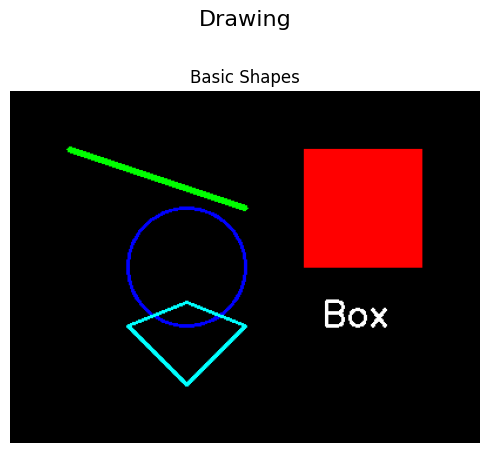

In [12]:
img_empty= np.zeros((300, 400, 3), dtype=np.uint8)
# Draw line
cv2.line(img_empty, (50, 50), (200, 100), (0, 255, 0), 3)

# Draw circle
cv2.circle(img_empty, (150, 150), 50, (255, 0, 0), 2)

# Draw rectangle
cv2.rectangle(img_empty, (250, 50), (350, 150), (0, 0, 255), -1)

# Draw polygon
points = np.array([[100, 200], [150, 250], [200, 200], [150, 180]], np.int32)
cv2.polylines(img_empty, [points], True, (255, 255, 0), 2)

# Adding text annotations
cv2.putText(img_empty, 'Box', (265, 200), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

plot = plot_images([img_empty], 'Basic Shapes', plot_name="Drawing", single=True)
plot.show()


# Section 2: Image Enhancement and Filtering

## Filters 濾波器
![alternatvie text](https://lh3.googleusercontent.com/d/1K3NwaHfMSQgK0PyopE36zxVvP18uXDyH)

## 2.1 Smoothing and Noise Reduction 套濾波器把噪音去掉

Shape: (300, 300, 3)
Height: 300
Width: 300
Channels: 3
Pixel value at top-left: [174 174 174]
Total pixels: 270000
Data type: uint8


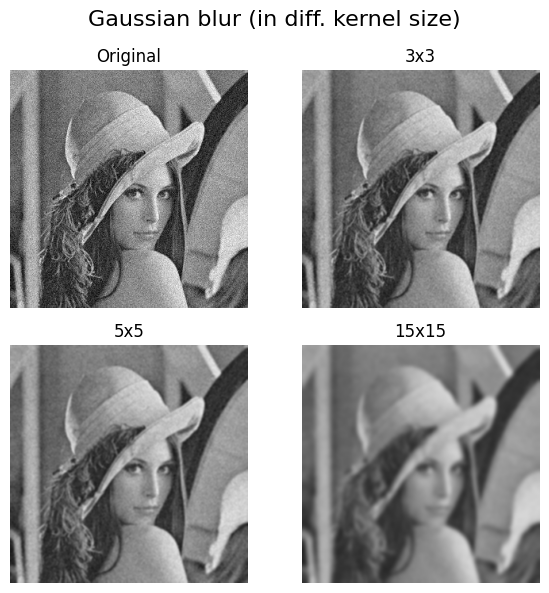

In [13]:
noisy = cv2.imread(os.path.join(img_data_path, 'noisy.jpg'))
img_basics_info(noisy)
blur1 = cv2.GaussianBlur(noisy, (3, 3), 0)
blur2 = cv2.GaussianBlur(noisy, (5, 5), 0)
blur3 = cv2.GaussianBlur(noisy, (15, 15), 0)

plot = plot_images([noisy, blur1, blur2, blur3], "Original", "3x3", '5x5', '15x15', plot_name="Gaussian blur (in diff. kernel size)")
plot.show()

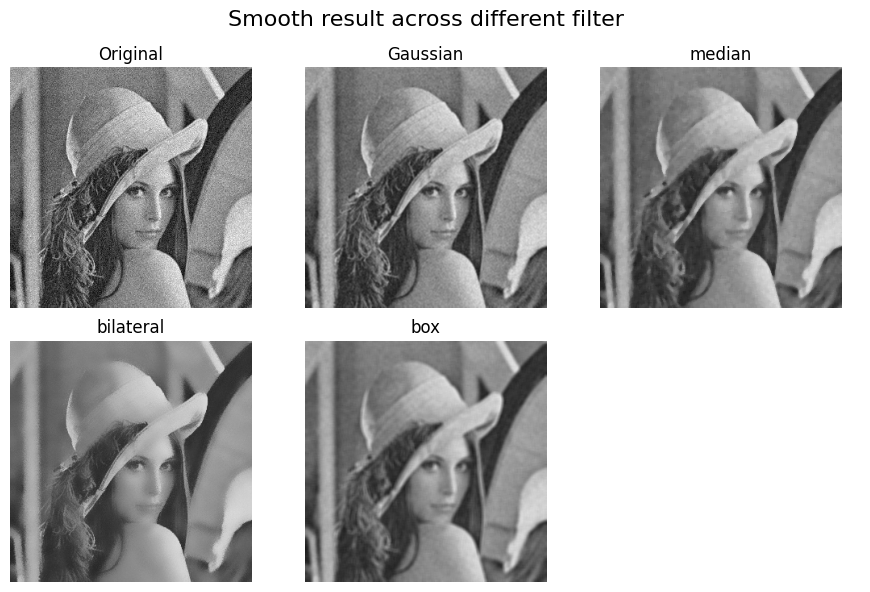

In [14]:
median = cv2.medianBlur(noisy, 5)
bilateral = cv2.bilateralFilter(noisy, 15, 150, 150)
box = cv2.boxFilter(noisy, -1, (5, 5))

plot = plot_images([noisy, blur1, median, bilateral, box], "Original", "Gaussian", "median", 'bilateral', 'box', plot_name="Smooth result across different filter")
plot.show()

## Kernel
![alternatvie text](https://lh3.googleusercontent.com/d/10LB9PETV9R725a7JKmdTHCghfqal7cos)


## Convolution
![alternatvie text](https://lh3.googleusercontent.com/d/1OBP4vbYREqAUpdkZWHyKvR182RsD800w)
![alternatvie text](https://lh3.googleusercontent.com/d/10TzuINsrSvDvfgl2x35QEc4OnehNr1Y5)

## 2.2 Morphological Operations

In [15]:
kernel_3 = np.ones((3,3), np.uint8)
kernel_5 = np.ones((5,5), np.uint8)
kernel_9 = np.ones((9,9), np.uint8)
kernel_3

array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8)

Shape: (150, 112, 3)
Height: 150
Width: 112
Channels: 3
Pixel value at top-left: [0 0 0]
Total pixels: 50400
Data type: uint8


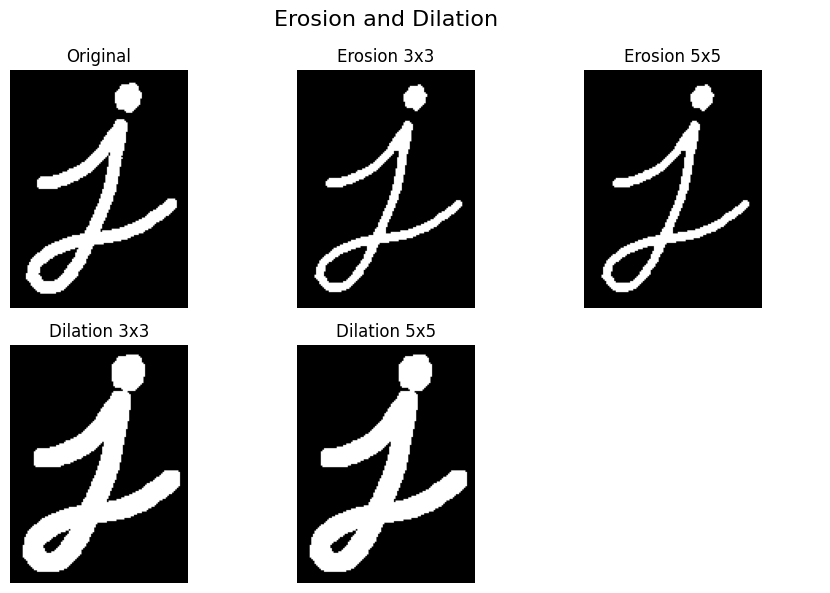

In [16]:
mor = cv2.imread(os.path.join(img_data_path, 'mor_1.png'))
img_basics_info(mor)

erosion1 = cv2.erode(mor, kernel_3, iterations=1)
erosion2 = cv2.erode(mor, kernel_3, iterations=1)
dilation1 = cv2.dilate(mor, kernel_5, iterations=1)
dilation2 = cv2.dilate(mor, kernel_5, iterations=1)

plot = plot_images([mor, erosion1, erosion2, dilation1, dilation2], "Original", "Erosion 3x3", "Erosion 5x5", 'Dilation 3x3', 'Dilation 5x5', plot_name="Erosion and Dilation")
plot.show()

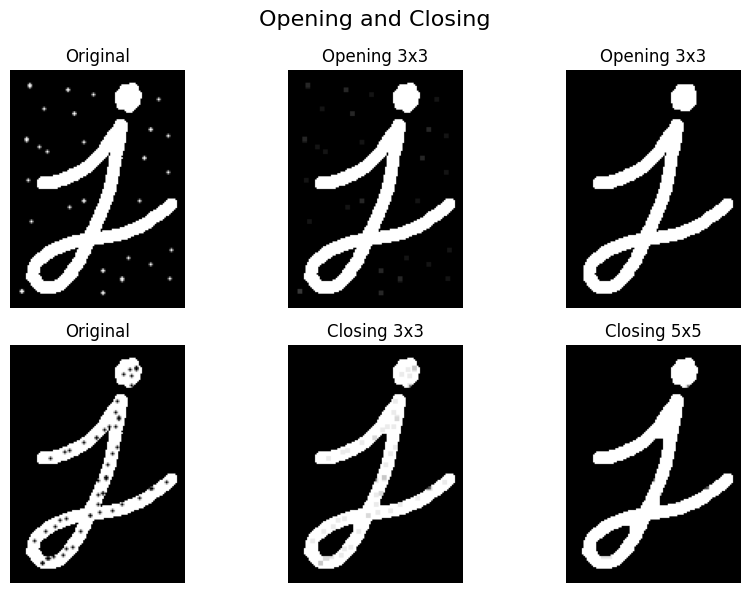

In [17]:
mor2 = cv2.imread(os.path.join(img_data_path, 'mor_2.png'))
mor3 = cv2.imread(os.path.join(img_data_path, 'mor_3.png'))
opening = cv2.morphologyEx(mor2, cv2.MORPH_OPEN, kernel_3)
opening2 = cv2.morphologyEx(mor2, cv2.MORPH_OPEN, kernel_5)
closing = cv2.morphologyEx(mor3, cv2.MORPH_CLOSE, kernel_3)
closing2 = cv2.morphologyEx(mor3, cv2.MORPH_CLOSE, kernel_5)
plot = plot_images([mor2 ,opening,opening2, mor3, closing,closing2], "Original", "Opening 3x3", "Opening 3x3","Original", "Closing 3x3","Closing 5x5",  plot_name="Opening and Closing")
plot.show()

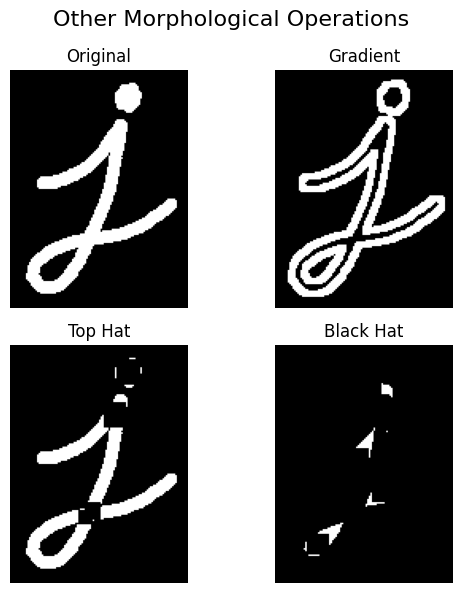

In [18]:
gradient = cv2.morphologyEx(mor, cv2.MORPH_GRADIENT, kernel_5)
tophat = cv2.morphologyEx(mor, cv2.MORPH_TOPHAT, kernel_9)
blackhat = cv2.morphologyEx(mor, cv2.MORPH_BLACKHAT, kernel_9)
plot = plot_images([mor ,gradient,tophat,blackhat], "Original", "Gradient", "Top Hat","Black Hat",  plot_name="Other Morphological Operations")
plot.show()

## 2.3 Image Sharpening and Enhancement

### add()

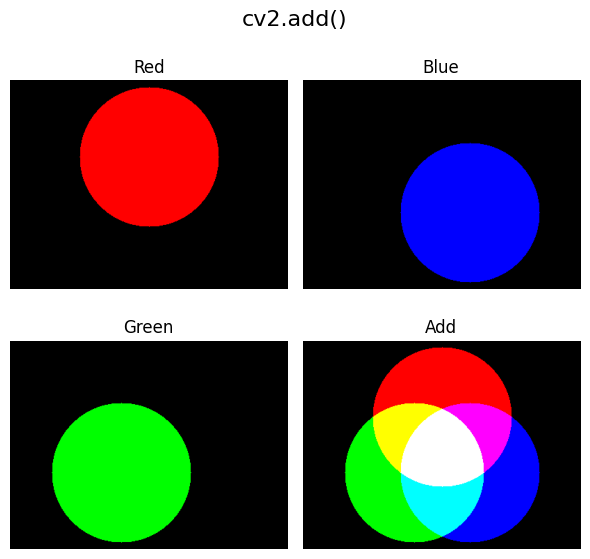

In [19]:
# create a blank image with a red circle in the middle
img_empty = np.zeros((300, 400, 3), dtype=np.uint8)

circle_red = cv2.circle(img_empty.copy(), (200, 110), 100, (0, 0, 255), -1)
circle_blue = cv2.circle(img_empty.copy(), (240, 190), 100, (255, 0, 0), -1)
circle_green = cv2.circle(img_empty.copy(), (160, 190), 100, (0, 255, 0), -1)

combined1 = cv2.add(circle_red, circle_green)
combined2 = cv2.add(combined1, circle_blue)

plot = plot_images([circle_red ,circle_blue,circle_green,combined2], "Red", "Blue", "Green","Add",  plot_name="cv2.add()")
plot.show()


### Unsharp mask amd sharp mask

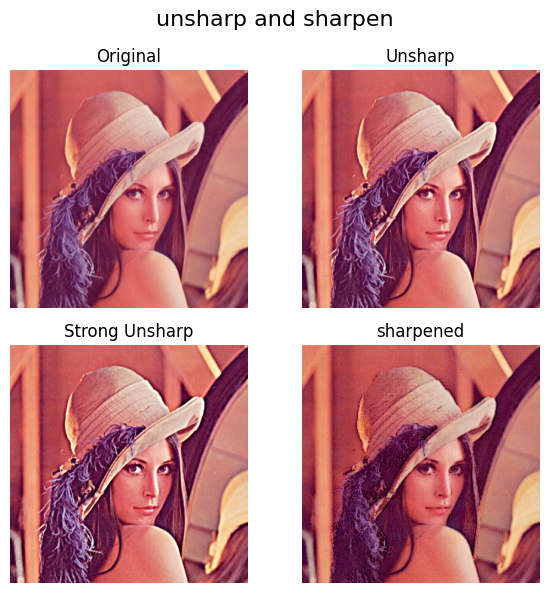

In [20]:
lenna = cv2.imread(os.path.join(img_data_path, 'Lenna.jpg'))

gaussian = cv2.GaussianBlur(lenna, (9, 9), 10.0)
unsharp = cv2.addWeighted(lenna, 1.5, gaussian, -0.5, 0)

# Stronger unsharp mask
unsharp_strong = cv2.addWeighted(lenna, 2.0, gaussian, -1.0, 0)

# Laplacian sharpen
b, g, r = cv2.split(lenna)
# Apply Laplacian on each channel
lap_b = cv2.Laplacian(b, cv2.CV_64F)
lap_g = cv2.Laplacian(g, cv2.CV_64F)
lap_r = cv2.Laplacian(r, cv2.CV_64F)

lap_b = np.uint8(np.absolute(lap_b))
lap_g = np.uint8(np.absolute(lap_g))
lap_r = np.uint8(np.absolute(lap_r))

# Subtract Laplacian to sharpen each channel
sharp_b = cv2.subtract(b, lap_b)
sharp_g = cv2.subtract(g, lap_g)
sharp_r = cv2.subtract(r, lap_r)

# Merge channels back
sharpened = cv2.merge((sharp_b, sharp_g, sharp_r))

plot = plot_images([lenna ,unsharp,unsharp_strong, sharpened], "Original", "Unsharp", "Strong Unsharp", "sharpened" , plot_name="unsharp and sharpen")
plot.show()


### Contrast and Brightness

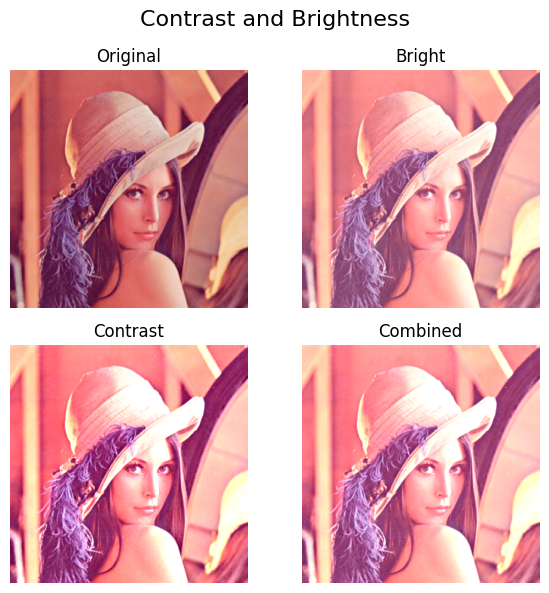

In [21]:
# Increase brightness
bright = cv2.add(lenna, np.ones(lenna.shape, dtype=np.uint8) * 50)

# Increase contrast
contrast = cv2.multiply(lenna, 1.5)

# Combined adjustment
adjusted = cv2.multiply(lenna, 1.3)
adjusted = cv2.add(adjusted, np.ones(lenna.shape, dtype=np.uint8) * 30)
plot = plot_images([lenna ,bright,contrast, adjusted], "Original", "Bright", "Contrast", "Combined" , plot_name="Contrast and Brightness")
plot.show()


## 2.4 Advanced Filtering

### Custom convolution

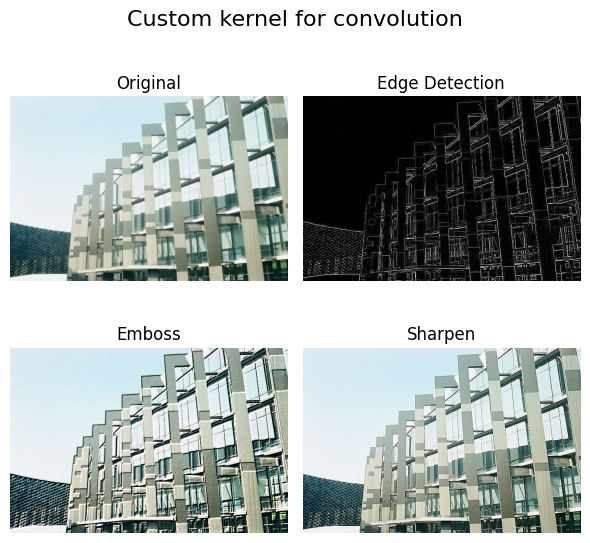

In [22]:
building = cv2.imread(os.path.join(img_data_path, 'building.jpg'))

# Edge detection kernel
edge_kernel = np.array([[-1, -1, -1],
                        [-1,  8, -1],
                        [-1, -1, -1]])

# Emboss kernel
emboss_kernel = np.array([[-2, -1,  0],
                            [-1,  1,  1],
                            [ 0,  1,  2]])

# Sharpen kernel
sharpen_kernel = np.array([[ 0, -1,  0],
                            [-1,  5, -1],
                            [ 0, -1,  0]])

edge_result = cv2.filter2D(building, -1, edge_kernel)
emboss_result = cv2.filter2D(building, -1, emboss_kernel)
sharpen_result = cv2.filter2D(building, -1, sharpen_kernel)

plot = plot_images([building ,edge_result,emboss_result, sharpen_result], "Original", "Edge Detection", "Emboss", "Sharpen" , plot_name="Custom kernel for convolution")
plot.show()


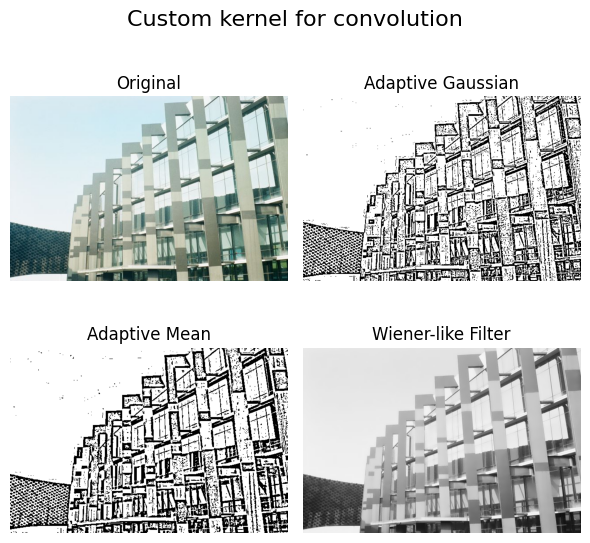

In [23]:
building = cv2.imread(os.path.join(img_data_path, 'building.jpg'))
gray = cv2.cvtColor(building, cv2.COLOR_BGR2GRAY)
# Adaptive Gaussian thresholding with filtering
adaptive_gaussian = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

# Adaptive mean thresholding
adaptive_mean = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

# Wiener-like filter simulation using local statistics
kernel = np.ones((9,9), np.float32) / 81
local_mean = cv2.filter2D(gray.astype(np.float32), -1, kernel)
local_sq_mean = cv2.filter2D((gray.astype(np.float32))**2, -1, kernel)
local_var = local_sq_mean - local_mean**2

noise_var = 100  # Estimated noise variance
wiener_factor = local_var / (local_var + noise_var)
wiener_filtered = local_mean + wiener_factor * (gray.astype(np.float32) - local_mean)

plot = plot_images([building, adaptive_gaussian,adaptive_mean,wiener_filtered.astype(np.uint8)], "Original", "Adaptive Gaussian", "Adaptive Mean", "Wiener-like Filter" , plot_name="Custom kernel for convolution")
plot.show()


# Section 3 - Feature Detection and Extraction

## What is Feature
上面那條是Kernel 的具象化\
![alternatvie text](https://lh3.googleusercontent.com/d/1epqPQw6IVnC9sKdjZmW719oIKviQ_Q7R)


## 3.1 Edge Detection

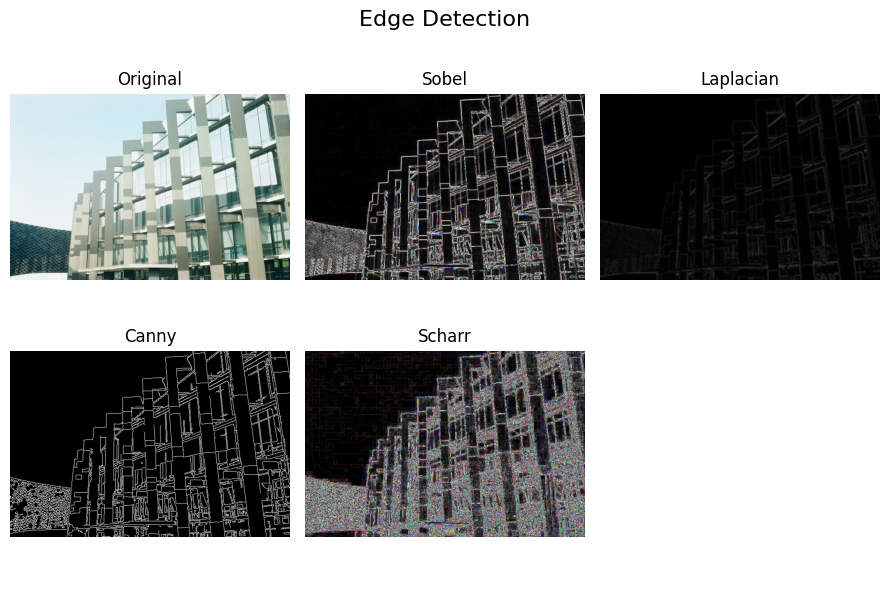

In [24]:
# Sobel operators
sobel_x = cv2.Sobel(building, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(building, cv2.CV_64F, 0, 1, ksize=3)
sobel_combined = np.sqrt(sobel_x**2 + sobel_y**2)

# Scharr operators
scharr_x = cv2.Scharr(building, cv2.CV_64F, 1, 0)
scharr_y = cv2.Scharr(building, cv2.CV_64F, 0, 1)
scharr_combined = np.sqrt(scharr_x**2 + scharr_y**2)

# Laplacian of Gaussian (LoG)
gaussian = cv2.GaussianBlur(building, (3, 3), 0)
laplacian = cv2.Laplacian(gaussian, cv2.CV_64F)


canny = cv2.Canny(building, 100, 200)


plot = plot_images([building, np.uint8(np.absolute(sobel_combined)),np.uint8(np.absolute(laplacian)), canny, np.uint8(np.absolute(scharr_combined))],
                    "Original", "Sobel", "Laplacian", "Canny","Scharr" , plot_name="Edge Detection")
plot.show()




## 3.2 Corner Detection

C:\Users\a0903\AppData\Local\Temp\ipykernel_24704\1997820515.py:13: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  corners = np.int0(corners)


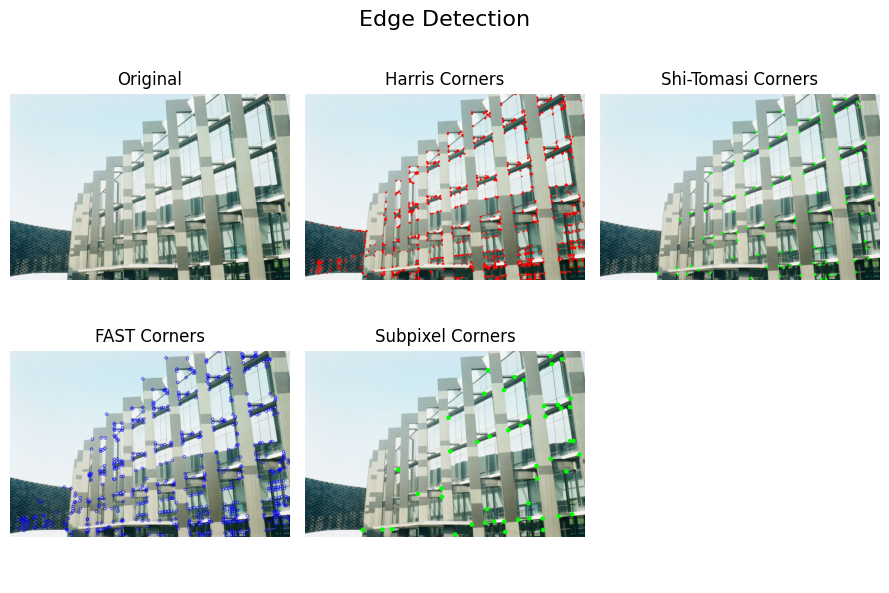

In [25]:
# Harris corner detection
gray = cv2.cvtColor(building, cv2.COLOR_BGR2GRAY)
harris = cv2.cornerHarris(gray, 2, 3, 0.04)

harris = cv2.dilate(harris, None)

img_harris = building.copy()
img_harris[harris > 0.01 * harris.max()] = [0, 0, 255]

# Shi-Tomasi
corners = cv2.goodFeaturesToTrack(gray, 100, 0.01, 10)
# corners2 = cv2.goodFeaturesToTrack(gray, 50, 0.05, 20)
corners = np.int0(corners)

img_Shi_Tomasi = building.copy()
for corner in corners:
    x, y = corner.ravel()
    cv2.circle(img_Shi_Tomasi, (x, y), 3, (0, 255, 0), -1)


# FAST
fast = cv2.FastFeatureDetector_create(threshold=50)

# keypoints
keypoints = fast.detect(gray, None)

img_fast = cv2.drawKeypoints(building, keypoints, None, color=(255, 0, 0))


# Subpixel 
corners = cv2.goodFeaturesToTrack(gray, 50, 0.01, 10)

# Refine corners to subpixel accuracy
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
corners_refined = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)

# original corners in red
img_subpixel_original = building.copy()
for corner in corners:
    x, y = corner.ravel()
    cv2.circle(img_subpixel_original, (int(x), int(y)), 5, (0, 0, 255), -1)

#refined corners in green
img_subpixel_refined = building.copy()
for corner in corners_refined:
    x, y = corner.ravel()
    cv2.circle(img_subpixel_refined, (int(x), int(y)), 5, (0, 255, 0), -1)


plot = plot_images([building, img_harris,img_Shi_Tomasi, img_fast, img_subpixel_refined],
                    "Original", "Harris Corners", "Shi-Tomasi Corners", "FAST Corners","Subpixel Corners" , plot_name="Edge Detection")
plot.show()


## 3.3 Feature Matching
![alternatvie text](https://lh3.googleusercontent.com/d/1W7S2F1mQUNEUzgyjDoQufIbMSiYSl78d)

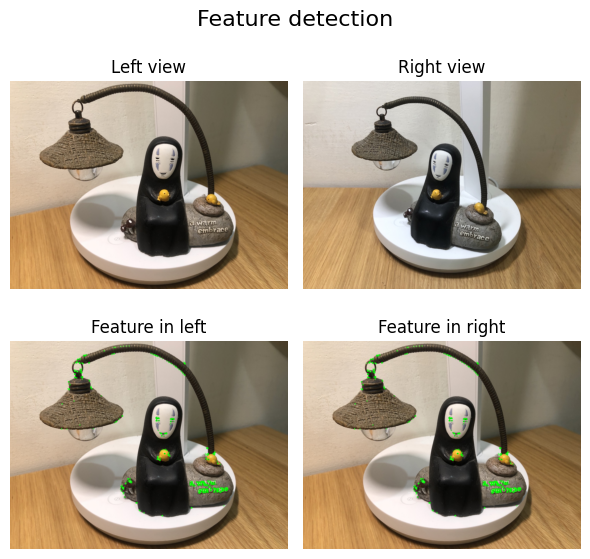

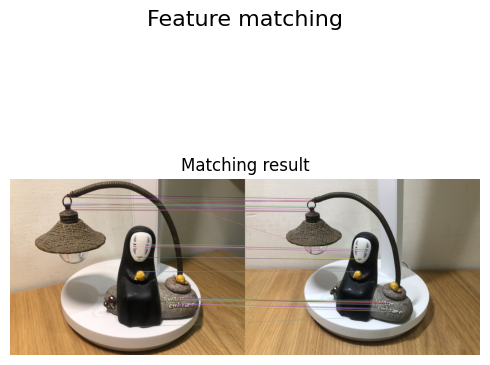

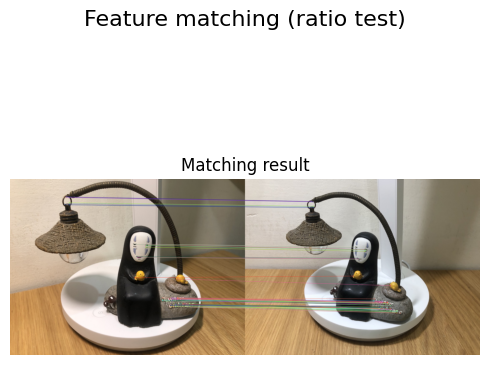

In [26]:
# ORB feature detection
feature_left = cv2.imread(os.path.join(img_data_path, 'feature_left.jpg'))
feature_right = cv2.imread(os.path.join(img_data_path, 'feature_right.jpg'))

gray = cv2.cvtColor(feature_left, cv2.COLOR_BGR2GRAY)

orb = cv2.ORB_create(nfeatures=1000)
# detect keypoints and compute descriptors
kp1, des1 = orb.detectAndCompute(gray, None)
feature_draw_left = feature_left.copy() 
img_orb_left = cv2.drawKeypoints(feature_draw_left, kp1, None, color=(0, 255, 0), flags=0)


# find keypoints and descriptors in other views
kp2, des2 = orb.detectAndCompute(feature_right, None)
feature_draw_right = feature_left.copy() 
img_orb_right = cv2.drawKeypoints(feature_draw_right, kp1, None, color=(0, 255, 0), flags=0)

# BFMatcher with Hamming distance
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)

# Sort matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Draw matches
img_matches = cv2.drawMatches(feature_left, kp1, feature_right, kp2, matches[:50], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)


 # BFMatcher without cross check for ratio test
bf = cv2.BFMatcher(crossCheck=False)
matches = bf.knnMatch(des1, des2, k=2)
# Apply ratio test
good_matches = []
for match_pair in matches:
    if len(match_pair) == 2:
        m, n = match_pair
        if m.distance < 0.75 * n.distance:
            good_matches.append([m])

img_ratio = cv2.drawMatchesKnn(feature_left, kp1, feature_right, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plot = plot_images([feature_left, feature_right,img_orb_left, img_orb_right],
                    "Left view", "Right view", "Feature in left", "Feature in right", plot_name="Feature detection")
plot.show()

plot = plot_images([img_matches],"Matching result" , plot_name="Feature matching", single=True)
plot.show()

plot = plot_images([img_ratio],"Matching result" , plot_name="Feature matching (ratio test)", single=True)
plot.show()


## 3.4 Template Matching

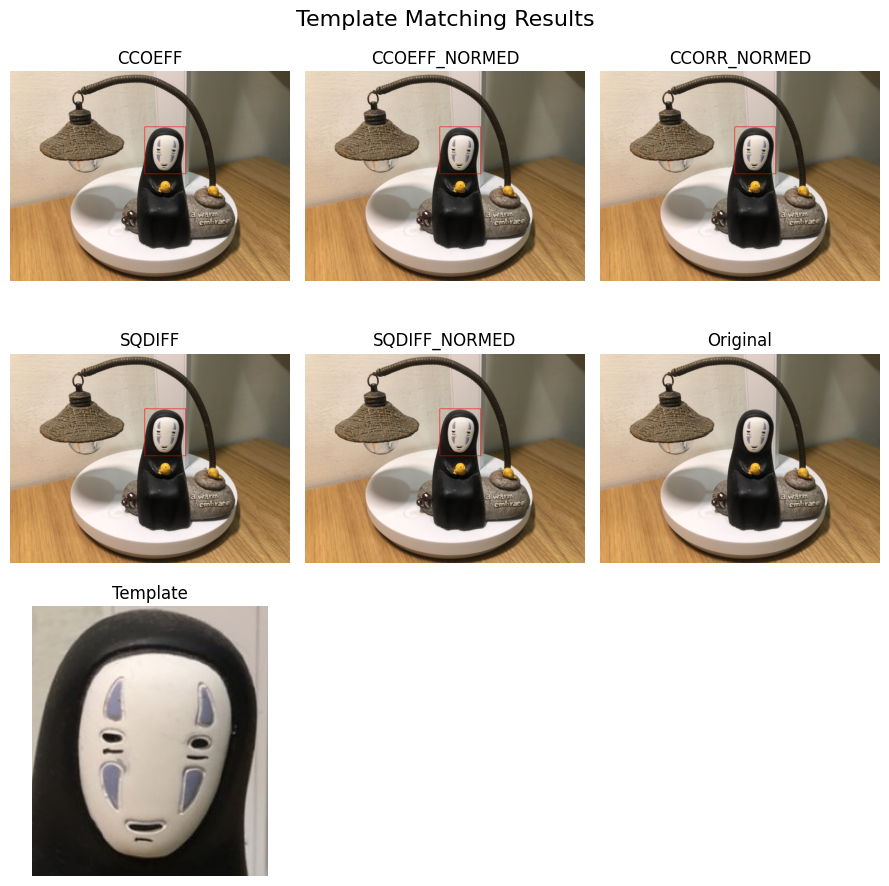

In [27]:
# Load template 
feature_left = cv2.imread(os.path.join(img_data_path, 'feature_left.jpg'))
template = cv2.imread(os.path.join(img_data_path, 'template.jpg'))
h, w = template.shape[:2]

# Matching methods
methods = [cv2.TM_CCOEFF, cv2.TM_CCOEFF_NORMED,
           cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]
method_names = ['CCOEFF', 'CCOEFF_NORMED',
                'CCORR_NORMED', 'SQDIFF', 'SQDIFF_NORMED']

result_images = []
result_labels = []

for i, method in enumerate(methods):
    feature_left_copy = feature_left.copy()
    result = cv2.matchTemplate(feature_left, template, method)

    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

    top_left = min_loc if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED] else max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv2.rectangle(feature_left_copy, top_left, bottom_right, (0, 0, 255), 2)

    result_images.append(feature_left_copy)
    result_labels.append(method_names[i])

result_images.extend([feature_left, template])
result_labels.extend(["Original", "Template"])

plot = plot_images(result_images, *result_labels, plot_name="Template Matching Results")
plot.show()

# Section 4 - Image Segmentation

## 4.1 Thresholding Methods
![alternatvie text](https://lh3.googleusercontent.com/d/15qy_woIdLDJ6nwoP1toQCgaMCCJV5e_e)

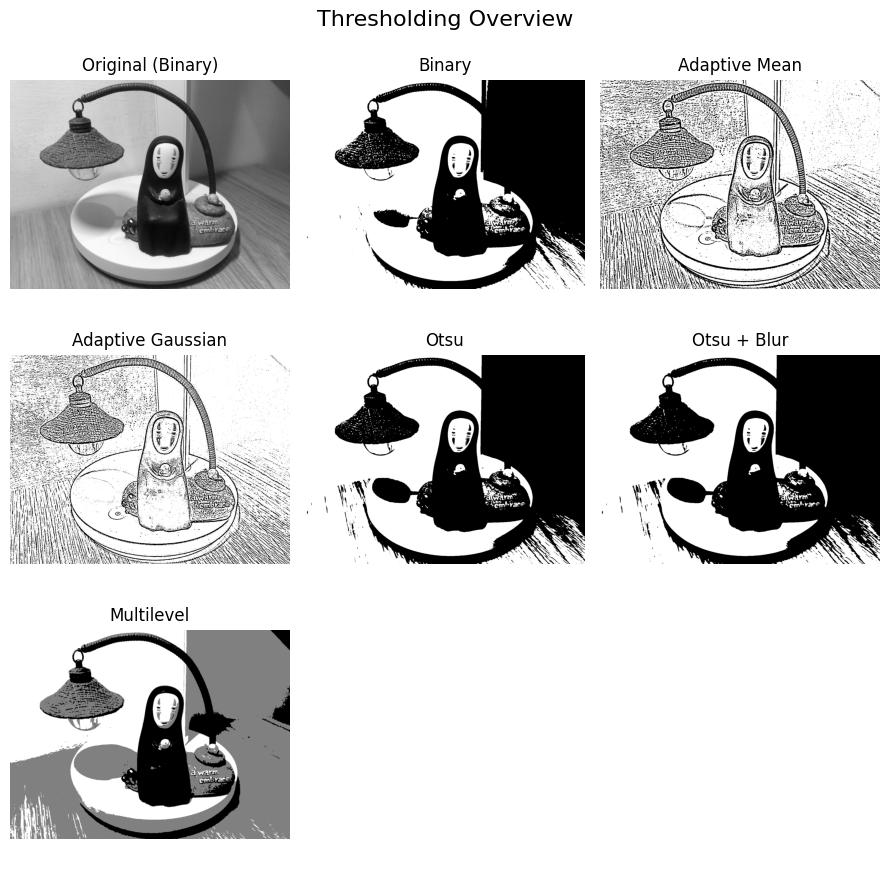

In [28]:
images = []
labels = []
feature_left = cv2.imread(os.path.join(img_data_path, 'feature_left.jpg'))
gray = cv2.cvtColor(feature_left, cv2.COLOR_BGR2GRAY)

# Binary 前景和背景分離
ret, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
images.append(gray)
labels.append("Original (Binary)")
images.append(binary)
labels.append("Binary")

# Adaptive Thresholding
mean_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
gauss_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
images.extend([mean_thresh, gauss_thresh])
labels.extend(["Adaptive Mean", "Adaptive Gaussian"])

#Otsu Thresholding
_, otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
blur = cv2.GaussianBlur(gray, (5, 5), 0)
_, otsu_blur = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
images.extend([otsu, otsu_blur])
labels.extend(["Otsu", "Otsu + Blur"])

# Multilevel Thresholding
multi = np.zeros_like(gray)
multi[gray < 85] = 0
multi[(gray >= 85) & (gray < 170)] = 128
multi[gray >= 170] = 255
images.extend([multi])
labels.extend(["Multilevel"])

# Show all
plot = plot_images(images, *labels, plot_name="Thresholding Overview")
plot.show()




## 4.2 Superpixel Segmentation

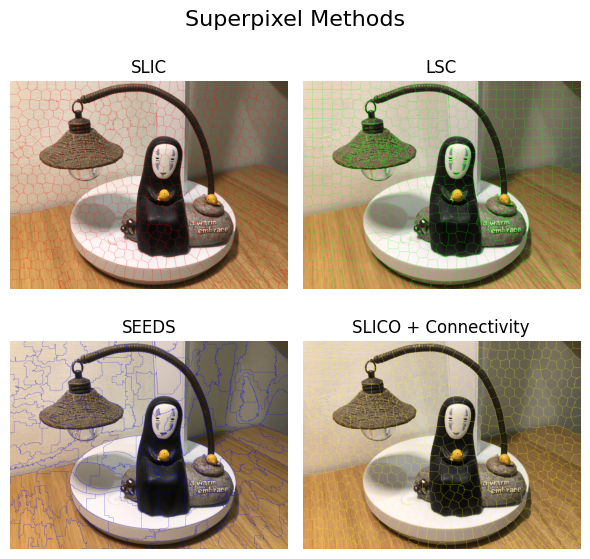

In [29]:
images = []
labels = []
feature_left = cv2.imread(os.path.join(img_data_path, 'feature_left.jpg'))

# SLIC
slic = cv2.ximgproc.createSuperpixelSLIC(feature_left, region_size=50, ruler=10.0)
slic.iterate(10)
mask = slic.getLabelContourMask()
slic_result = feature_left.copy()
slic_result[mask == 255] = [0, 0, 255]
images.append(slic_result)
labels.append("SLIC")

# LSC
lsc = cv2.ximgproc.createSuperpixelLSC(feature_left, region_size=50, ratio=0.1)
lsc.iterate(10)
mask = lsc.getLabelContourMask()
lsc_result = feature_left.copy()
lsc_result[mask == 255] = [0, 255, 0]
images.append(lsc_result)
labels.append("LSC")

# SEEDS
h, w, c = feature_left.shape
seeds = cv2.ximgproc.createSuperpixelSEEDS(w, h, c, num_superpixels=200, num_levels=4)
seeds.iterate(feature_left, 10)
mask = seeds.getLabelContourMask()
seeds_result = feature_left.copy()
seeds_result[mask == 255] = [255, 0, 0]
images.append(seeds_result)
labels.append("SEEDS")

# SLICO & connectivity
slico = cv2.ximgproc.createSuperpixelSLIC(feature_left, algorithm=cv2.ximgproc.SLICO, region_size=50)
slico.iterate(10)
slico.enforceLabelConnectivity(25)
mask = slico.getLabelContourMask()
tune_result = feature_left.copy()
tune_result[mask == 255] = [0, 255, 255]
images.append(tune_result)
labels.append("SLICO + Connectivity")

# Show all
plot = plot_images(images, *labels, plot_name="Superpixel Methods")
plot.show()



## 4.3 Advanced Segmentation Method

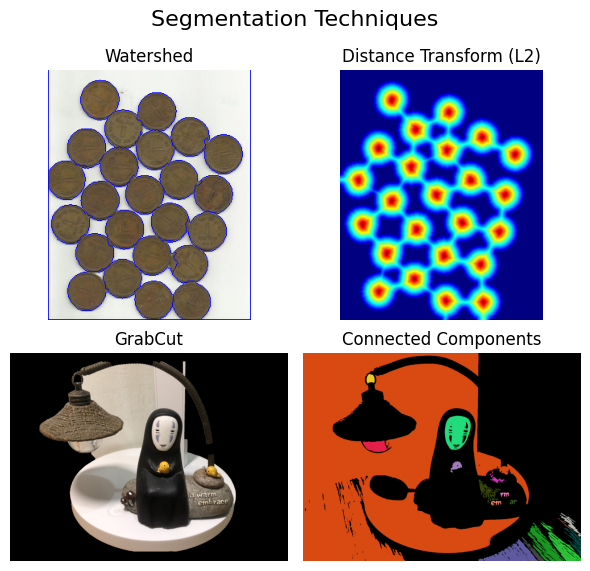

In [30]:
results = []
titles = []
water_coins = cv2.imread(os.path.join(img_data_path, 'water_coins.jpg'))
water_coins_gray = cv2.cvtColor(water_coins, cv2.COLOR_BGR2GRAY)

feature_left = cv2.imread(os.path.join(img_data_path, 'feature_left.jpg'))
gray = cv2.cvtColor(feature_left, cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

# Watershed
ret, thresh_coints = cv2.threshold(water_coins_gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresh_coints,cv2.MORPH_OPEN,kernel, iterations = 2)
sure_bg = cv2.dilate(opening,kernel,iterations=3)
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)
ret, markers = cv2.connectedComponents(sure_fg)
markers = markers+1
markers[unknown==255] = 0
watershed_img = water_coins.copy()
markers = cv2.watershed(watershed_img,markers)
watershed_img[markers == -1] = [255,0,0]
results.append(watershed_img)
titles.append("Watershed")

# Distance Transform
_, binary = cv2.threshold(water_coins_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
dist_l2 = cv2.distanceTransform(thresh_coints, cv2.DIST_L2, 5)
dist_norm = cv2.normalize(dist_l2, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
dist_color = cv2.applyColorMap(dist_norm, cv2.COLORMAP_JET)
results.append(dist_color)
titles.append("Distance Transform (L2)")

# GrabCut
h, w = feature_left.shape[:2]
mask = np.zeros((h, w), np.uint8)
rect = (50, 50, w - 100, h - 100)
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)
cv2.grabCut(feature_left, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
grabcut_result = feature_left * mask2[:, :, np.newaxis]
results.append(grabcut_result)
titles.append("GrabCut")



#Connected Components
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary)

labeled_img = np.zeros_like(feature_left)
for i in range(1, num_labels):
    area = stats[i, cv2.CC_STAT_AREA]
    if area > 500:  # filter small areas
        mask = labels == i
        labeled_img[mask] = np.random.randint(0, 255, 3)
results.append(labeled_img)
titles.append("Connected Components")

# Plot all results
plot = plot_images(results, *titles, plot_name="Segmentation Techniques")
plot.show()


## 4.4 Find Contour 把邊連起來變物件

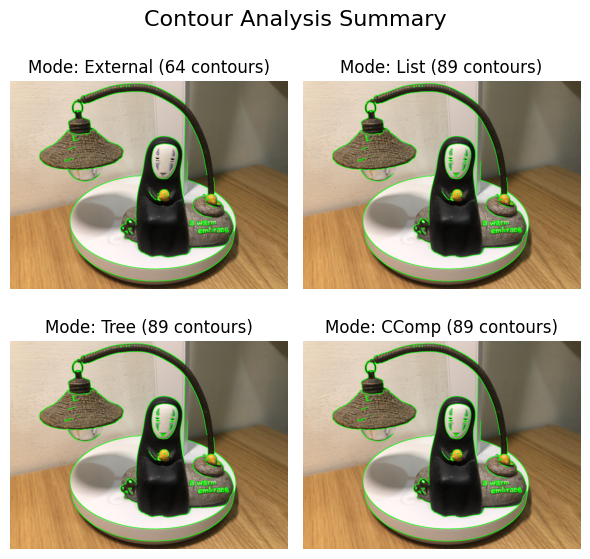

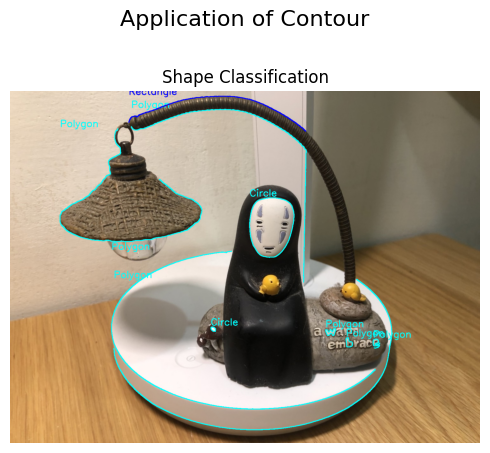

In [31]:
images = []
titles = []
feature_left = cv2.imread(os.path.join(img_data_path, 'feature_left.jpg'))
gray = cv2.cvtColor(feature_left, cv2.COLOR_BGR2GRAY)
#_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
blurred = cv2.GaussianBlur(gray, (11, 11), 0)
binaryIMG = cv2.Canny(blurred, 20, 160)

# Retrieval Modes Comparison
modes = {
    "External": cv2.RETR_EXTERNAL,
    "List": cv2.RETR_LIST,
    "Tree": cv2.RETR_TREE,
    "CComp": cv2.RETR_CCOMP
}
for name, mode in modes.items():
    img_mode = feature_left.copy()
    #contours, _ = cv2.findContours(thresh, mode, cv2.CHAIN_APPROX_SIMPLE)
    contours, _ = cv2.findContours(binaryIMG, mode, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(img_mode, contours, -1, (0, 255, 0), 2)
    images.append(img_mode)
    titles.append(f'Mode: {name} ({len(contours)} contours)')

# Contour Properties & Shape Classification 分類
img_prop = feature_left.copy()
contours, _ = cv2.findContours(binaryIMG, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

for c in contours:
    if cv2.contourArea(c) > 100:
        x, y, w, h = cv2.boundingRect(c)
        rect_area = w * h
        aspect_ratio = float(w) / h
        extent = cv2.contourArea(c) / rect_area
        hull = cv2.convexHull(c)
        solidity = cv2.contourArea(c) / cv2.contourArea(hull)
        approx = cv2.approxPolyDP(c, 0.02 * cv2.arcLength(c, True), True)
        vertices = len(approx)
        shape = "Unknown"
        color = (255, 255, 255)
        if vertices == 3:
            shape = "Triangle"; color = (0, 255, 0)
        elif vertices == 4:
            shape = "Square" if 0.95 < aspect_ratio < 1.05 else "Rectangle"
            color = (255, 0, 0)
        elif vertices > 4:
            shape = "Circle" if solidity > 0.95 else "Polygon"
            color = (255, 255, 0)
        cv2.drawContours(img_prop, [c], -1, color, 2)
        cv2.putText(img_prop, shape, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)


plot = plot_images(images, *titles, plot_name="Contour Analysis Summary")
plot.show()

plot = plot_images([img_prop], "Shape Classification", plot_name="Application of Contour", single=True)
plot.show()


# Section 5 - Geometric Transformations

## 5.1 Basic Transformations
對圖片做扭曲
增加模型的樣本數

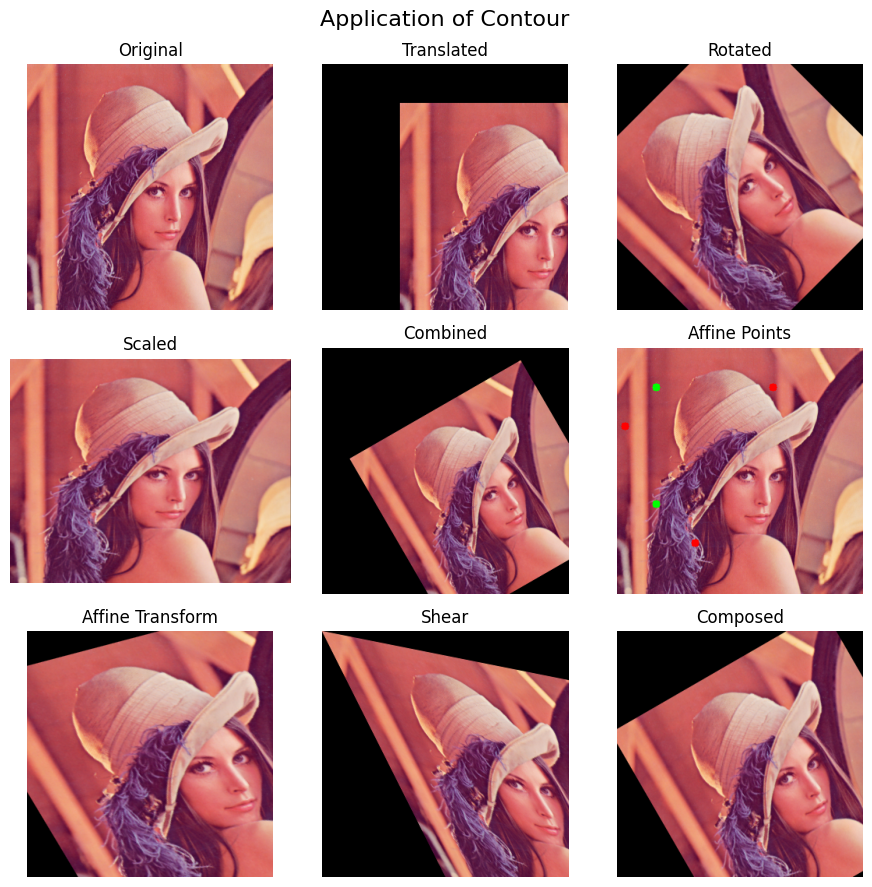

In [32]:

lenna = cv2.imread(os.path.join(img_data_path, 'Lenna.jpg'))
height, width = lenna.shape[:2]

# Translation
tx, ty = 100, 50
translation_matrix = np.float32([[1, 0, tx], [0, 1, ty]])
translated = cv2.warpAffine(lenna, translation_matrix, (width, height))

# Rotation
center = (width//2, height//2)
angle = 45
rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
rotated = cv2.warpAffine(lenna, rotation_matrix, (width, height))

# Scaling
scale_x, scale_y = 1.5, 1.2
scaling_matrix = np.float32([[scale_x, 0, 0], [0, scale_y, 0]])
scaled = cv2.warpAffine(lenna, scaling_matrix, (int(width*scale_x), int(height*scale_y)))

# Combined transformation
combined = cv2.getRotationMatrix2D(center, 30, 0.8)
combined[0, 2] += 50  # Add translation
combined[1, 2] += 30
combined_result = cv2.warpAffine(lenna, combined, (width, height))


# three points for affine transformation
pts1 = np.float32([[50, 50], [200, 50], [50, 200]])
pts2 = np.float32([[10, 100], [200, 50], [100, 250]])

# transformation matrix
affine_matrix = cv2.getAffineTransform(pts1, pts2)
affine_result = cv2.warpAffine(lenna, affine_matrix, (width, height))

# Shear transformation
shear_matrix = np.float32([[1, 0.5, 0], [0.2, 1, 0]])
sheared = cv2.warpAffine(lenna, shear_matrix, (width, height))

# rotation then translation
rotation = cv2.getRotationMatrix2D((width//2, height//2), 30, 1.0)
translation = np.float32([[1, 0, 50], [0, 1, 30]])
composed = np.dot(translation, np.vstack([rotation, [0, 0, 1]]))[:2]
composed_result = cv2.warpAffine(lenna, composed, (width, height))

img_points = lenna.copy()
for pt in pts1:
    cv2.circle(img_points, tuple(pt.astype(int)), 5, (0, 255, 0), -1)
for pt in pts2:
    cv2.circle(img_points, tuple(pt.astype(int)), 5, (0, 0, 255), -1)
plot = plot_images([lenna,translated, rotated, scaled, combined_result, img_points,affine_result,sheared,composed_result], 
                   "Original", "Translated", "Rotated", "Scaled", "Combined",
                   "Affine Points", "Affine Transform","Shear","Composed",  plot_name="Application of Contour")
plot.show()


## 5.2 Image Wrapping and Perspective Transformation
![alternatvie text](https://lh3.googleusercontent.com/d/1Gt43hJqt2ScU3QxD0AK1jZAyerdCLWco)
![alternatvie text](https://lh3.googleusercontent.com/d/1uQ9r1PUDhPviuP2lxUI25ZBbraVcZwkF)

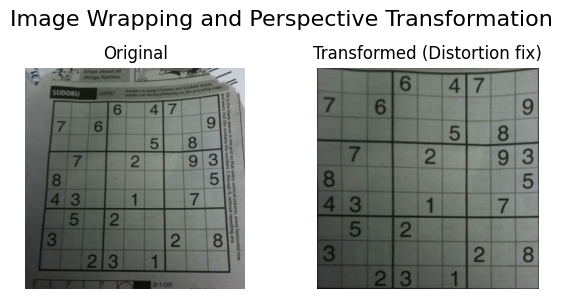

In [33]:
sudoku = cv2.imread(os.path.join(img_data_path, 'sudoku.jpg'))

rows,cols,ch = sudoku.shape
 
pts1 = np.float32([[56,65],[368,52],[28,387],[389,390]])
pts2 = np.float32([[0,0],[300,0],[0,300],[300,300]])
 
M = cv2.getPerspectiveTransform(pts1,pts2)
 
dst = cv2.warpPerspective(sudoku,M,(300,300))

plot = plot_images([sudoku,dst], "Original", "Transformed (Distortion fix)",  plot_name="Image Wrapping and Perspective Transformation")
plot.show()



## 5.3 Homography Estimation and Image Stitching
做扭曲後 每個方塊往哪個方向走
![alternatvie text](https://lh3.googleusercontent.com/d/1ad4aQzj4QXpeOGaDXi59toEXysXxbA82)

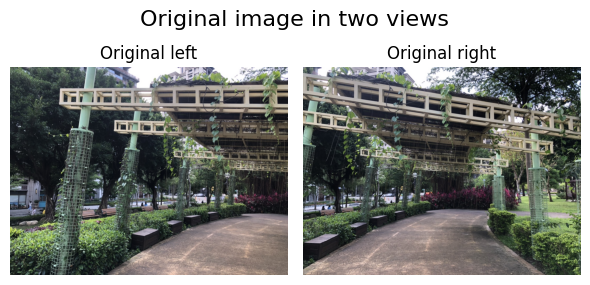

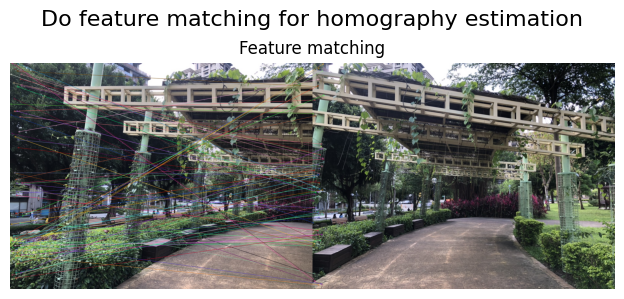

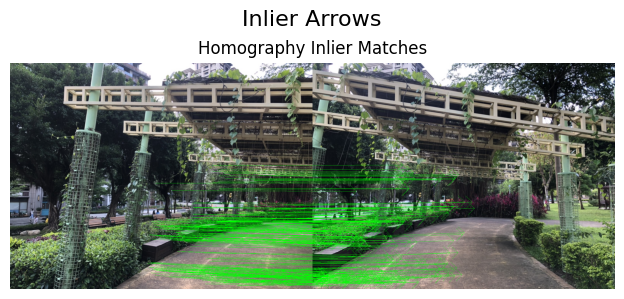

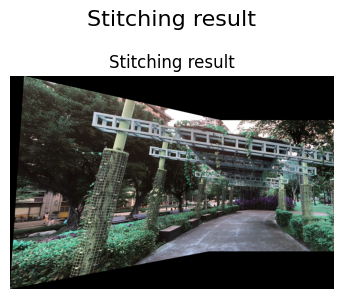

In [34]:
import random
img1_color = cv2.imread(os.path.join(img_data_path, 'stitch_1.jpg')) # left
img2_color = cv2.imread(os.path.join(img_data_path, 'stitch_2.jpg')) # right

img1 = cv2.cvtColor(img1_color, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2_color, cv2.COLOR_BGR2GRAY)

# SIFT for feature matching
sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# Ratio Test
ratio_thresh = 0.75
good_matches = []
for m, n in matches:
    if m.distance < ratio_thresh * n.distance:
        good_matches.append(m)

img_match = cv2.drawMatches(img1_color, kp1, img2_color, kp2, good_matches[:], None, flags=2)

# BF Matcher + Ratio test
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)

good = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good.append(m)


if len(good) < 4:
    print("Not enough feature points for homography estimation")
else:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # homography
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    # visualize the homography
    concat = np.hstack((img1_color, img2_color))  # left and right images side by side

    for i, m in enumerate(good):
        # only draw 50% of the result
        p = random.random()
        if p>0.8:
            if mask[i]:  
                pt1 = tuple(np.round(kp1[m.queryIdx].pt).astype(int))
                pt2 = tuple(np.round(kp2[m.trainIdx].pt).astype(int))
                pt2_shifted = (pt2[0] + img1_color.shape[1], pt2[1])  # shift right image X

                # arrow from img1 to img2
                cv2.arrowedLine(concat, pt1, pt2_shifted, (0, 255, 0), 1, tipLength=0.05)
            else:
                continue

    # Set the max range of output image
    h1, w1 = img1.shape
    h2, w2 = img2.shape

    # transformation
    corners_img1 = np.float32([[0,0], [0,h1], [w1,h1], [w1,0]]).reshape(-1,1,2)
    warped_corners = cv2.perspectiveTransform(corners_img1, H)
    corners_img2 = np.float32([[0,0], [0,h2], [w2,h2], [w2,0]]).reshape(-1,1,2)
    all_corners = np.concatenate((warped_corners, corners_img2), axis=0)

    # calculate margine
    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

    # translation
    translate = [-xmin, -ymin]
    H_translation = np.array([[1, 0, translate[0]],
                              [0, 1, translate[1]],
                              [0, 0, 1]])

    # image warpping
    result = cv2.warpPerspective(img1_color, H_translation @ H, (xmax - xmin, ymax - ymin))

    result[translate[1]:translate[1]+h2, translate[0]:translate[0]+w2] = img2_color
    result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)


plot = plot_images([img1_color,img2_color], "Original left", "Original right",  plot_name="Original image in two views")
plot.show()
plot = plot_images([img_match], "Feature matching" ,  plot_name="Do feature matching for homography estimation",single=True, rect=True)
plot.show()
plot = plot_images([concat], "Homography Inlier Matches", plot_name="Inlier Arrows", single=True,rect=True)
plot.show()
plot = plot_images([result], "Stitching result" ,  plot_name="Stitching result", single=True,rect=True)
plot.show()

## 5.4 Applicatoin - Panorama

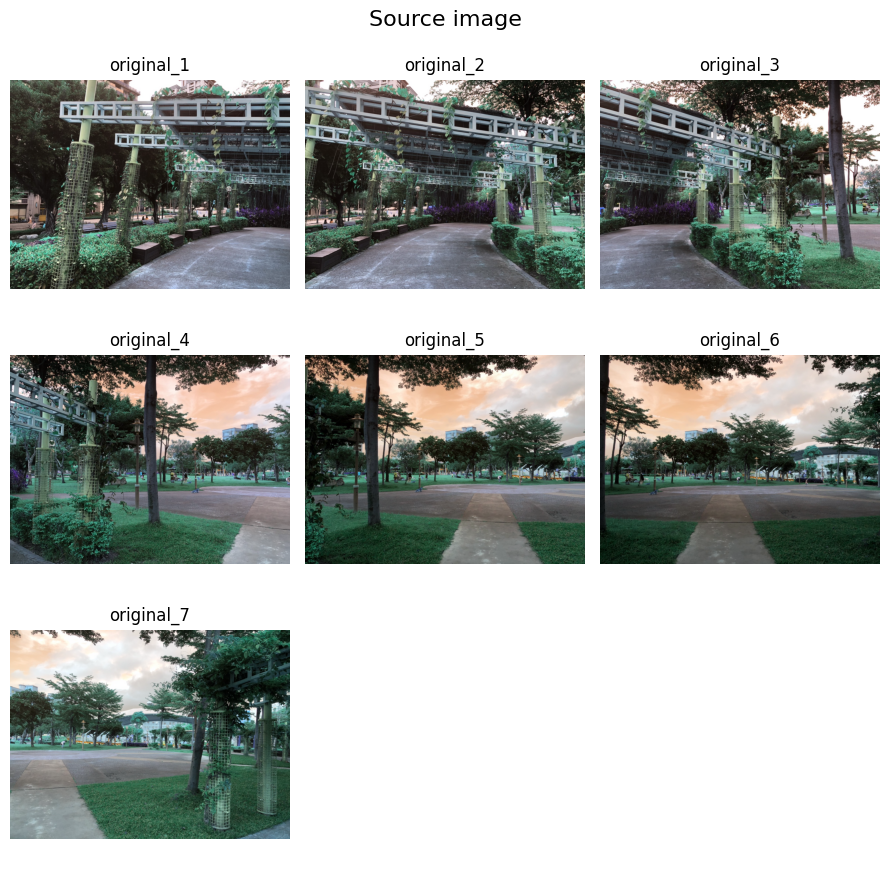

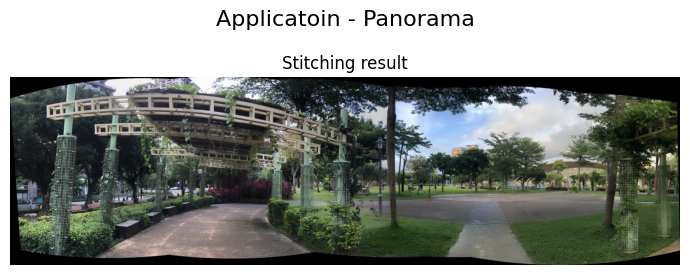

In [35]:
img_list_path = []
labels = []
for i in range(7):
    i+=1
    img_list_path.append(os.path.join(img_data_path, f'stitch_{i}.jpg'))
    labels.append(f'original_{i}')
    
img_list = [cv2.imread(path) for path in img_list_path]

imgs = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in img_list if img is not None]

# Need OpenCV above 4.x 
stitcher = cv2.Stitcher_create()

# image stiching
status, pano = stitcher.stitch(imgs)
result = cv2.cvtColor(pano, cv2.COLOR_BGR2RGB)

plot = plot_images(imgs, *labels ,  plot_name="Source image")
plot.show()
plot = plot_images([result], "Stitching result" ,  plot_name="Applicatoin - Panorama", single=True,rect=True)
plot.show()




全景圖的背後原理全景圖的背後原理

# Section 6 - Camera Geometry and 3D Vision

![alternatvie text](https://lh3.googleusercontent.com/d/187PuLT3BYlGPqks4KtV0UOEIZIsUe3tQ)

## 6.1 Camera Calibration

Intrinsic Matrix: [[2.22537754e+03 0.00000000e+00 1.02846874e+03]
 [0.00000000e+00 2.22455456e+03 1.04010501e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


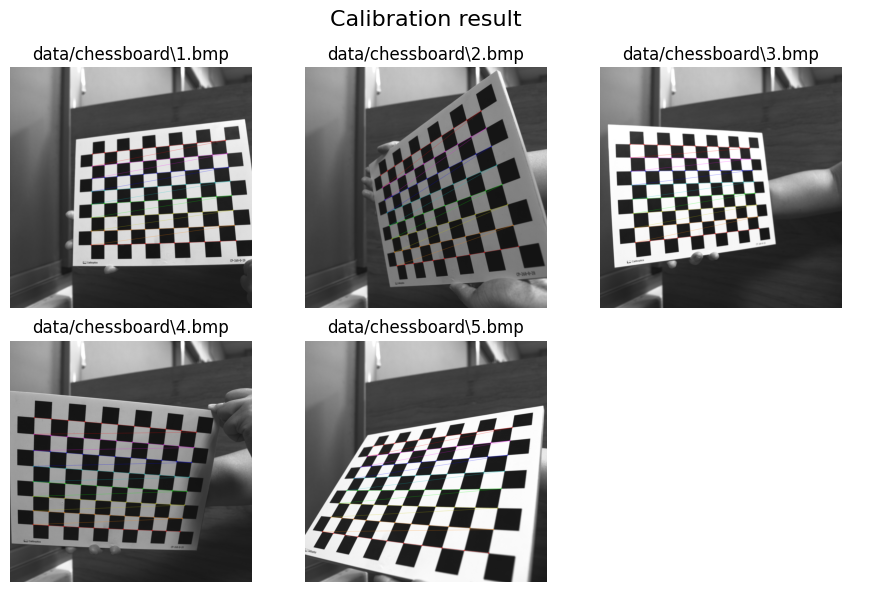

In [36]:
# grid of chessboard 
pattern_size=(11, 8)
chessboard_dir = 'data/chessboard'
chessboard_img = []
chessboard_name = []
objpoints, imgpoints = [], []
objp = np.zeros((pattern_size[1]*pattern_size[0], 3), np.float32)
objp[:, :2] = np.mgrid[0:pattern_size[0], 0:pattern_size[1]].T.reshape(-1, 2)

chessboard_paths = sorted([
    os.path.join(chessboard_dir, fname)
    for fname in os.listdir(chessboard_dir)
    if fname.endswith('.bmp')
])

for fname in chessboard_paths:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    found, corners = cv2.findChessboardCorners(gray, pattern_size, None)
    if found:
        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1),
                                    (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001))
        fnl = cv2.drawChessboardCorners(img, (11, 8), corners2, found)
        chessboard_img.append(fnl)
        chessboard_name.append(fname)
        imgpoints.append(corners2)
        objpoints.append(objp)

img_shape = gray.shape[::-1]
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_shape, None, None)
print(f'Intrinsic Matrix: {mtx}')
plot_images(chessboard_img, *chessboard_name, plot_name="Calibration result").show()

對每張圖做座標系 matrix
把每一個特徵點 圖片之間對應的座標
利用這些可以算出相機的內部參數

## 6.2 Application - toy example

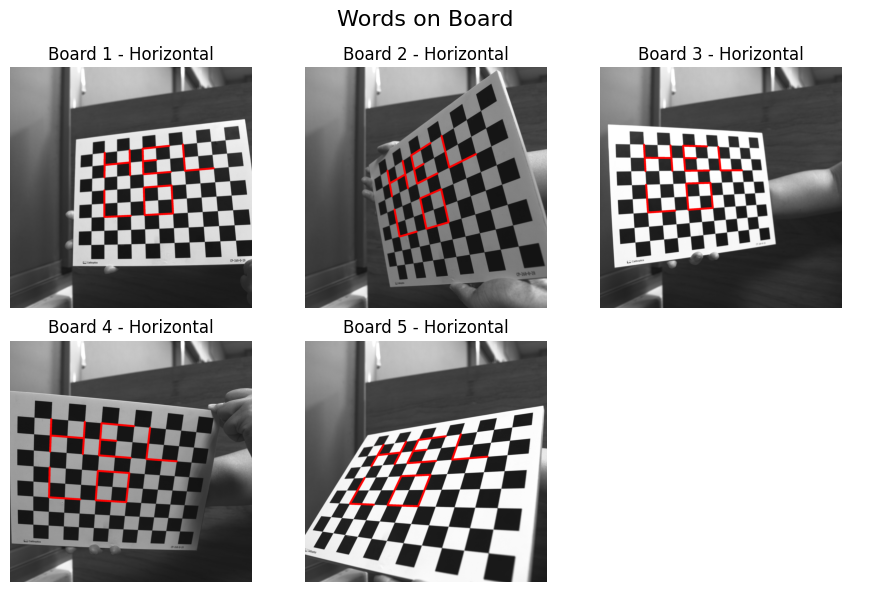

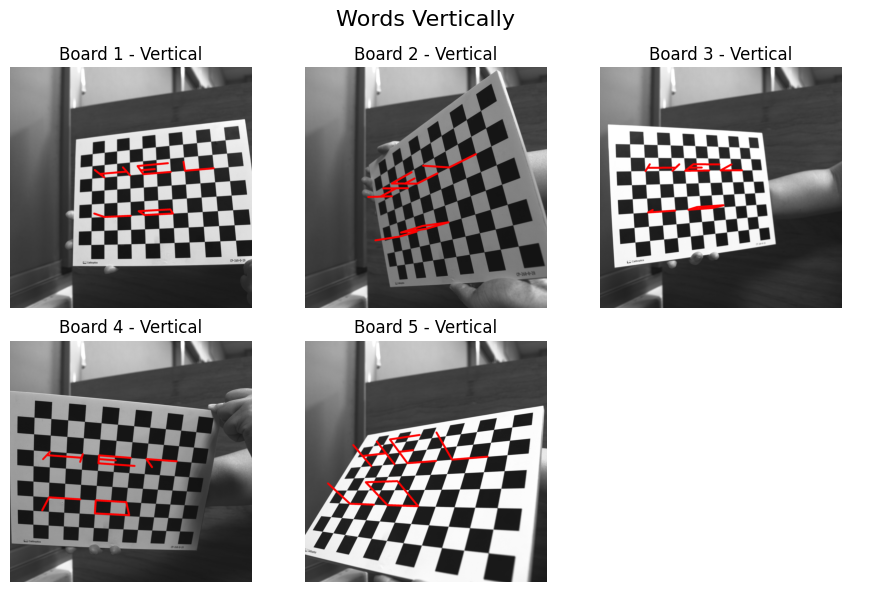

In [37]:
def area(number,letter):
    if number ==1:
        for i in range(letter.shape[0]):
            letter[i,0] = letter[i,0]+7
            letter[i,1] = letter[i,1]+5

    if number ==2:
        for i in range(letter.shape[0]):
            letter[i,0] = letter[i,0]+4
            letter[i,1] = letter[i,1]+5

    if number ==3:
        for i in range(letter.shape[0]):
            letter[i,0] = letter[i,0]+1
            letter[i,1] = letter[i,1]+5

    if number ==4:
        for i in range(letter.shape[0]):
            letter[i,0] = letter[i,0]+7
            letter[i,1] = letter[i,1]+2

    if number ==5:
        for i in range(letter.shape[0]):
            letter[i,0] = letter[i,0]+4
            letter[i,1] = letter[i,1]+2

    if number ==6:
        for i in range(letter.shape[0]):
            letter[i,0] = letter[i,0]+1
            letter[i,1] = letter[i,1]+2
    return letter

def draw_letters_on_board(image_path, letter_file, letters, objpoints, imgpoints, mtx, dist, index):
    fs = cv2.FileStorage(letter_file, cv2.FILE_STORAGE_READ)
    img = cv2.imread(image_path)

    for i, char in enumerate(letters.upper()):
        ch = fs.getNode(char).mat().reshape(-1, 3).astype(np.float32)
        ch_transformed = area(i + 1,ch)
        ret, rvecs, tvecs = cv2.solvePnP(objpoints[index], imgpoints[index], mtx, dist)
        imgpts, _ = cv2.projectPoints(ch_transformed, rvecs, tvecs, mtx, dist)
        imgpts = imgpts.reshape(-1, 2)
        for j in range(0, len(imgpts), 2):
            pt1, pt2 = tuple(imgpts[j].astype(int)), tuple(imgpts[j+1].astype(int))
            img = cv2.line(img, pt1, pt2, (0, 0, 255), 15)

    return cv2.resize(img, (img.shape[1]//2, img.shape[0]//2))

alphabet_onboard = 'data/alphabet/alphabet_lib_onboard.txt'
alphabet_vertical = 'data/alphabet/alphabet_lib_vertical.txt'
letters = 'hello'

# Show Words on Borad 
images_onboard = []
labels_onboard = []
for i in range(5):
    img = draw_letters_on_board(chessboard_paths[i], alphabet_onboard, letters, objpoints, imgpoints, mtx, dist, i)
    images_onboard.append(img)
    labels_onboard.append(f"Board {i+1} - Horizontal")

# Show Worlds Vertically
images_vertical = []
labels_vertical = []
for i in range(5):
    img = draw_letters_on_board(chessboard_paths[i], alphabet_vertical, letters, objpoints, imgpoints, mtx, dist, i)
    images_vertical.append(img)
    labels_vertical.append(f"Board {i+1} - Vertical")

plot_images(images_onboard, *labels_onboard, plot_name="Words on Board").show()
plot_images(images_vertical, *labels_vertical, plot_name="Words Vertically").show()


# Section 7 - Advance Applications of CV

## 7.1 Lane Detection (Hough Transform)

![alternatvie text](https://lh3.googleusercontent.com/d/1k0MvsKPH4d0gDIqmWZlla6b9b2hfY4c5)
![alternatvie text](https://lh3.googleusercontent.com/d/1zU4AFLvWfD-cgJtkt0x32mm6xoO9nwJN)

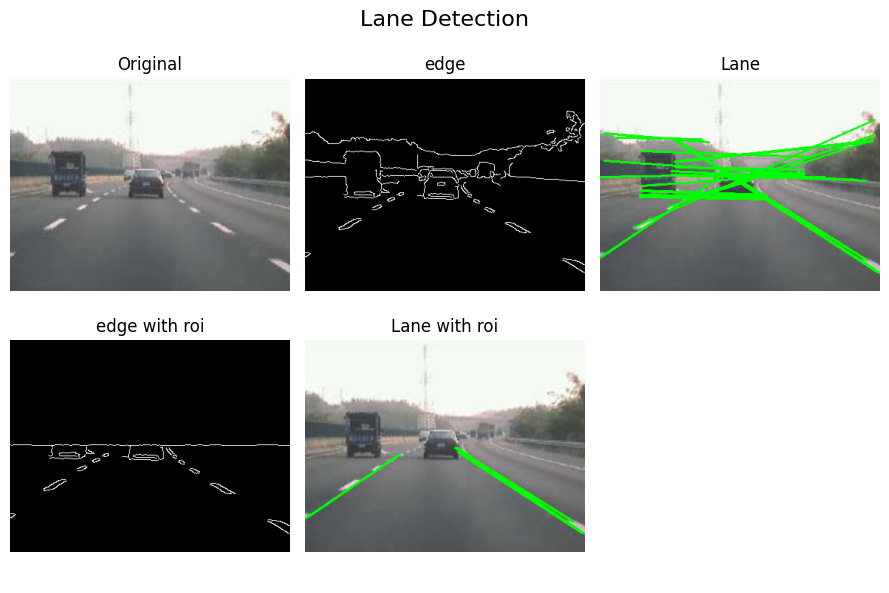

In [38]:
# Lane detection 
lane = cv2.imread(os.path.join(img_data_path,'lane.png'))
gray = cv2.cvtColor(lane, cv2.COLOR_BGR2GRAY)

# Edge detection
blur = cv2.GaussianBlur(gray, (5, 5), 0)
edges = cv2.Canny(blur, 50, 150)

# ApplyROI (lower half of image)
lane_roi = cv2.imread(os.path.join(img_data_path,'lane.png'))
gray_roi = cv2.cvtColor(lane, cv2.COLOR_BGR2GRAY)
height, width = gray_roi.shape
mask = np.zeros_like(gray_roi)
roi_vertices = np.array([[(0, height),(0,height//2), (width, height//2), (width, height)]], dtype=np.int32)
cv2.fillPoly(mask, roi_vertices, 255)
masked_gray = cv2.bitwise_and(gray, mask)
blur_roi = cv2.GaussianBlur(masked_gray, (5, 5), 0)
edges_roi = cv2.Canny(blur_roi, 50, 150)

# Hough line detection
lines_ = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=35, minLineLength=100, maxLineGap=100)
lines_roi = cv2.HoughLinesP(edges_roi, 1, np.pi/180, threshold=35, minLineLength=100, maxLineGap=100)

img_lanes = lane.copy()
img_lanes_roi = lane_roi.copy()
def filter_horizontal_lines(lines, horizontal_threshold=0.5):
    if lines is None:
        return None
    
    filtered_lines = []
    for line in lines:
        x1, y1, x2, y2 = line[0]
        if x2 - x1 == 0:  
            filtered_lines.append(line)
            continue
        
        slope = (y2 - y1) / (x2 - x1)
        
        # Keep only lines that are not nearly horizontal
        if abs(slope) >= horizontal_threshold:
            filtered_lines.append(line)
    
    return np.array(filtered_lines) if filtered_lines else None

def draw(lines, img):
    # Separate left and right lanes
    left_lines = []
    right_lines = []

    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            if x2 - x1 == 0:  # Vertical line
                continue
            slope = (y2 - y1) / (x2 - x1)
            if slope < -0.7 and slope>-2:  # Left lane
                left_lines.append(line[0])
            elif slope > 0.7 and slope <2:  # Right lane
                right_lines.append(line[0])


    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Draw left lane in blue
    for line in left_lines:
        x1, y1, x2, y2 = line
        cv2.line(img, (x1, y1), (x2, y2), (255, 0, 0), 3)

    # Draw right lane in red
    for line in right_lines:
        x1, y1, x2, y2 = line
        cv2.line(img, (x1, y1), (x2, y2), (0, 0, 255), 3)
    return img

lines_roi = filter_horizontal_lines(lines_roi, horizontal_threshold=0.3)
img_lanes = draw(lines_,img_lanes)
img_lanes_roi = draw(lines_roi,img_lanes_roi)

plot_images([lane, edges, img_lanes, edges_roi, img_lanes_roi],"Original","edge", "Lane", "edge with roi", "Lane with roi", plot_name="Lane Detection").show()




一個camera 可以做出的車道

## Object detection & tracking (GMM, Opticalflow)
影像處理
速度快 便宜 不用GPU 不用人工標註 只要用技術把前景濾出來就可以了\
![alternatvie text](https://lh3.googleusercontent.com/d/1dXOnfupfAHVfLEwTxhZjXHWi51SAYrZy)

## Image inpainting and restoration (Gaussian pyramid)
![alternatvie text](https://lh3.googleusercontent.com/d/11pW9_OXgIRJU9qmT7lJzXLdoMImCxoCW)
![alternatvie text](https://lh3.googleusercontent.com/d/146Lvod29OlXoGRfuMZ2_cc0_on57S-1b)

## Document and Text Processing (OCR, OMR)
![alternatvie text](https://lh3.googleusercontent.com/d/1pyAa9t-QEvglkE7_V-yD8EqjEY_bE85j)

## 3D Reconstruction 
### (Keypoint detection, Feature matching, Camera Calibration, 2D to 3D Triangulation)
![alternatvie text](https://lh3.googleusercontent.com/d/1sW8R12wrJs_yvp7t2GebwQl1pyvZqbKA)